<h1><center>

</center></h1>
<font size="6"><center>
EIE 401
PROCESAMIENTO DIGITAL MULTIMEDIA 
</center></font>


<center><h2>Actividad 3</h2></center>
<center><h3>Audio</h3></center>
<center><h3>Profesor: Jorge Cardenas</h3></center>

<center><h3>Por: Guillermo Cortés Medina</h3></center>
<center><h5>Pontificia Universidad Catolica de Valparaiso</h5></center>
 

# Ayudantía
## 1.1 Realiza la operación de convolución

<p align="justify">
Una de las operaciones más comunes en tratamiento de imagenes, video etc, es la convolución. Comienza por realizar una convolución entre una señal Pulso y una función impulso filtrada.


<center><img src="../../assets/scipy-signal-convolution.png"/></center>

## 1.2 Aplique la transformada rápida de fourier a una señal de audio
<p align="justify">
El archivo de audio debe ser formato .WAV, con menos de 30 segundo de duración.


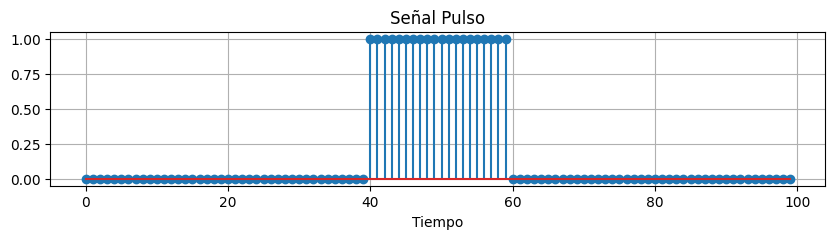

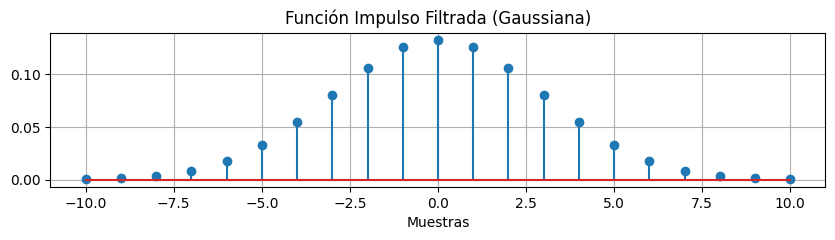

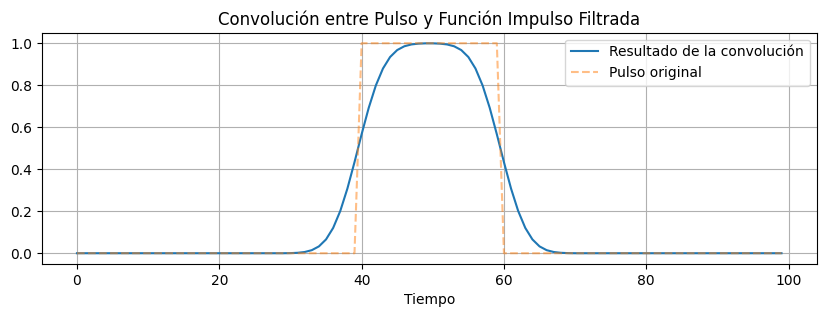

In [13]:
# --- 1.1 ---
import numpy as np
import matplotlib.pyplot as plt

# Dominio de tiempo
t = np.arange(0, 100)

# Señal tipo pulso
pulso = np.zeros_like(t)
pulso[40:60] = 1  # Pulso entre las posiciones 40 y 59

plt.figure(figsize=(10, 2))
plt.stem(t, pulso)
plt.title("Señal Pulso")
plt.xlabel("Tiempo")
plt.grid(True)
plt.show()

# Crear una gaussiana como filtro
def gaussiana(x, sigma=3):
    return np.exp(-x**2 / (2*sigma**2))

x_filtro = np.arange(-10, 11)  # Dominio para la función gaussiana
filtro = gaussiana(x_filtro)
filtro /= np.sum(filtro)  # Normalizar para que no cambie la energía de la señal

plt.figure(figsize=(10, 2))
plt.stem(x_filtro, filtro)
plt.title("Función Impulso Filtrada (Gaussiana)")
plt.xlabel("Muestras")
plt.grid(True)
plt.show()

# Convolución entre el pulso y el filtro
resultado = np.convolve(pulso, filtro, mode='same')

plt.figure(figsize=(10, 3))
plt.plot(t, resultado, label="Resultado de la convolución")
plt.plot(t, pulso, '--', alpha=0.5, label="Pulso original")
plt.title("Convolución entre Pulso y Función Impulso Filtrada")
plt.xlabel("Tiempo")
plt.legend()
plt.grid(True)
plt.show()


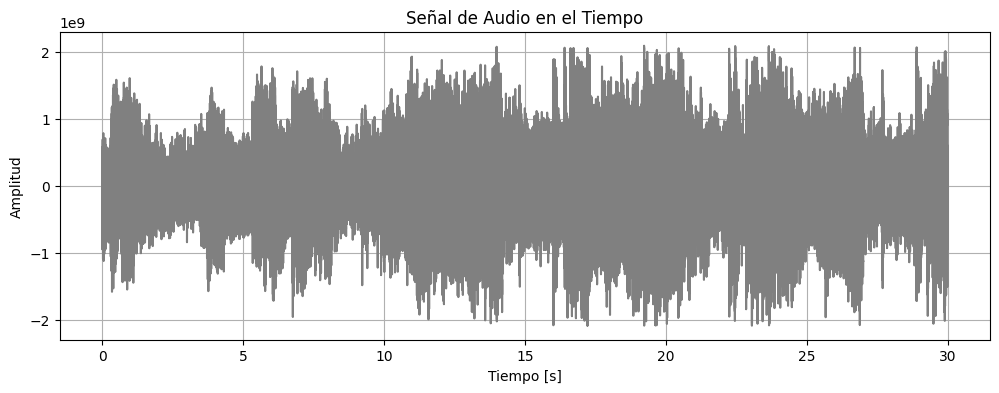

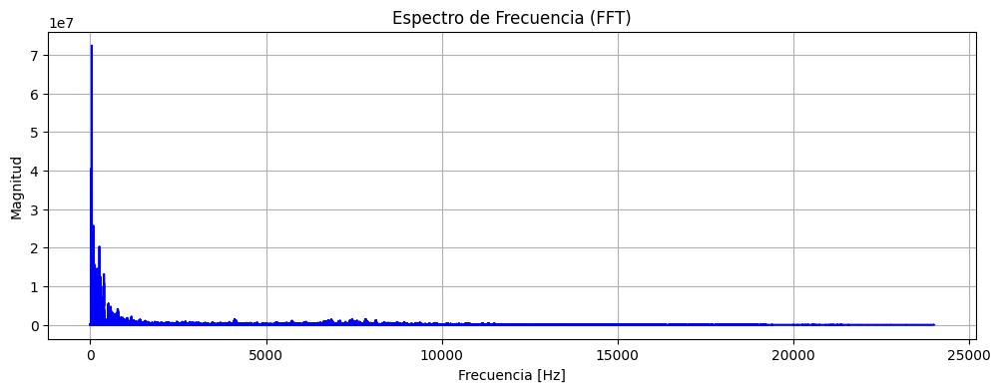

In [20]:
# --- 1.2 ---

import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

# --- 1. Cargar el archivo de audio ---
# Asegúrate de tener un archivo llamado 'audio.wav' en el mismo directorio
fs, data = wavfile.read('audio.wav')  # fs: frecuencia de muestreo, data: muestras

# --- 2. Convertir a mono si es estéreo ---
if len(data.shape) == 2:
    data = data.mean(axis=1)  # Promediamos los dos canales

# --- 3. Duración máxima (en segundos) ---
max_duration = 30  # segundos
max_samples = fs * max_duration
data = data[:max_samples]

# --- 4. Aplicar la Transformada Rápida de Fourier (FFT) ---
N = len(data)
frequencies = np.fft.fftfreq(N, 1/fs)
spectrum = np.fft.fft(data)
magnitude = np.abs(spectrum) / N

# Solo la mitad positiva del espectro
half = N // 2
frequencies = frequencies[:half]
magnitude = magnitude[:half]

# --- 5. Visualizar el audio en el tiempo ---
time = np.arange(len(data)) / fs
plt.figure(figsize=(12, 4))
plt.plot(time, data, color='gray')
plt.title('Señal de Audio en el Tiempo')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()

# --- 6. Visualizar el espectro de frecuencias ---
plt.figure(figsize=(12, 4))
plt.plot(frequencies, magnitude, color='blue')
plt.title('Espectro de Frecuencia (FFT)')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud')
plt.grid(True)
plt.show()

fs, data = wavfile.read('audio.wav')
from IPython.display import Audio

# Reproducir el archivo de audio
Audio('audio.wav')


## 2. Cancelación de Ruido (Denoising)
<p align="justify">
Implementa un algoritmo para eliminar el ruido de una señal. Puedes apoyarte en esta referencia (https://www.youtube.com/watch?v=s2K1JfNR7Sc)

1. Debes tener la señal original
2. Debes agregar ruido a la señal
3. Obtener el valor medio de la señal con ruido
4. Implementar transformaciones y filtrado.
    


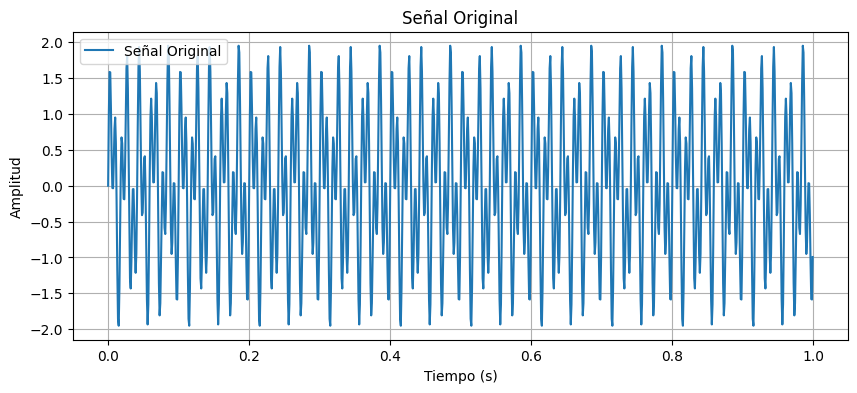

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la señal
dt = 0.001  # Intervalo de muestreo
t = np.arange(0, 1, dt)  # Vector de tiempo de 0 a 1 segundo
frecuencia1 = 50  # Frecuencia de la primera onda (Hz)
frecuencia2 = 120  # Frecuencia de la segunda onda (Hz)

# Señal original: suma de dos ondas sinusoidales
señal_original = np.sin(2 * np.pi * frecuencia1 * t) + np.sin(2 * np.pi * frecuencia2 * t)

# Visualizar la señal original
plt.figure(figsize=(10, 4))
plt.plot(t, señal_original, label='Señal Original')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.title('Señal Original')
plt.legend()
plt.grid(True)
plt.show()


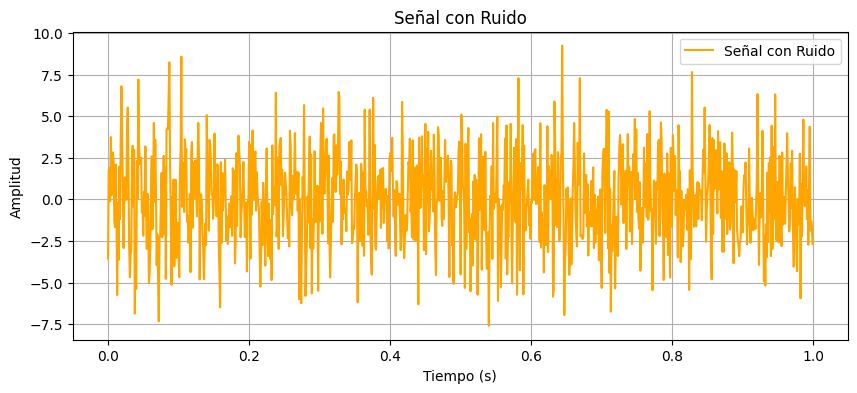

In [2]:
# Parámetros del ruido
amplitud_ruido = 2.5  # Amplitud del ruido

# Generar ruido gaussiano
ruido = amplitud_ruido * np.random.randn(len(t))

# Señal con ruido
señal_con_ruido = señal_original + ruido

# Visualizar la señal con ruido
plt.figure(figsize=(10, 4))
plt.plot(t, señal_con_ruido, label='Señal con Ruido', color='orange')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.title('Señal con Ruido')
plt.legend()
plt.grid(True)
plt.show()


In [3]:
# Calcular el valor medio
valor_medio = np.mean(señal_con_ruido)
print(f"Valor medio de la señal con ruido: {valor_medio:.4f}")


Valor medio de la señal con ruido: -0.0148


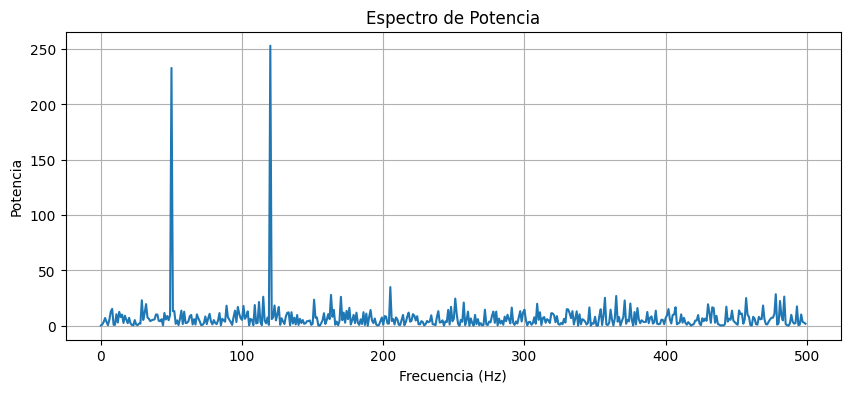

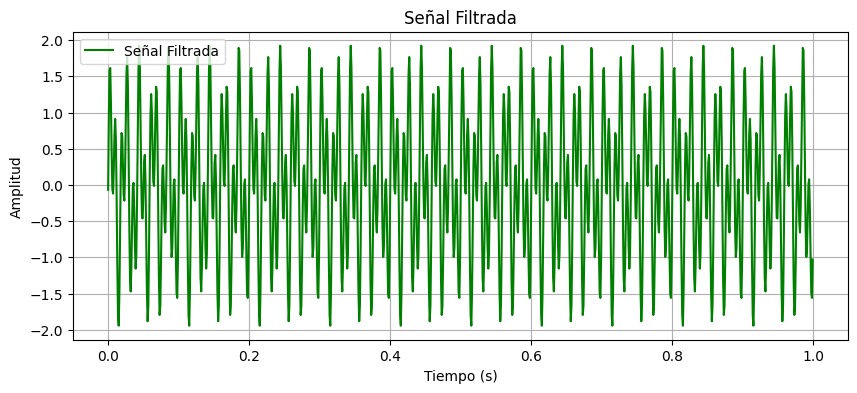

In [4]:
from numpy.fft import fft, ifft

# Aplicar FFT a la señal con ruido
n = len(señal_con_ruido)
frecuencias = np.fft.fftfreq(n, d=dt)
transformada = fft(señal_con_ruido)

# Calcular el espectro de potencia
espectro_potencia = np.abs(transformada) ** 2 / n

# Visualizar el espectro de potencia
plt.figure(figsize=(10, 4))
plt.plot(frecuencias[:n // 2], espectro_potencia[:n // 2])
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Potencia')
plt.title('Espectro de Potencia')
plt.grid(True)
plt.show()

# Filtrar frecuencias con potencia por debajo de un umbral
umbral = 100  # Este valor puede ajustarse según sea necesario
indices_filtrados = espectro_potencia > umbral
transformada_filtrada = transformada * indices_filtrados

# Aplicar la transformada inversa para obtener la señal filtrada
señal_filtrada = np.real(ifft(transformada_filtrada))

# Visualizar la señal filtrada
plt.figure(figsize=(10, 4))
plt.plot(t, señal_filtrada, label='Señal Filtrada', color='green')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.title('Señal Filtrada')
plt.legend()
plt.grid(True)
plt.show()


## 3. Wavelets
### 3.1 Desarrolla una transformada wavelet 1D
<p align="justify">
Implementa transformaciones con 1-D wavelet usando la función Mexican Hat Wavelet.

$$m(x) = \frac{2}{\sqrt{3 \sigma} \pi^{\frac{1}{4}}} \left(1-\frac{x^2}{\sigma^2}\right) e^{\frac{-x^2}{2 \sigma^2}}$$


In [5]:
import numpy as np
import matplotlib.pyplot as plt

def mexican_hat(x, sigma):
    coef = 2 / (np.sqrt(3 * sigma) * np.pi**0.25)
    factor = (1 - (x**2) / (sigma**2)) * np.exp(-x**2 / (2 * sigma**2))
    return coef * factor


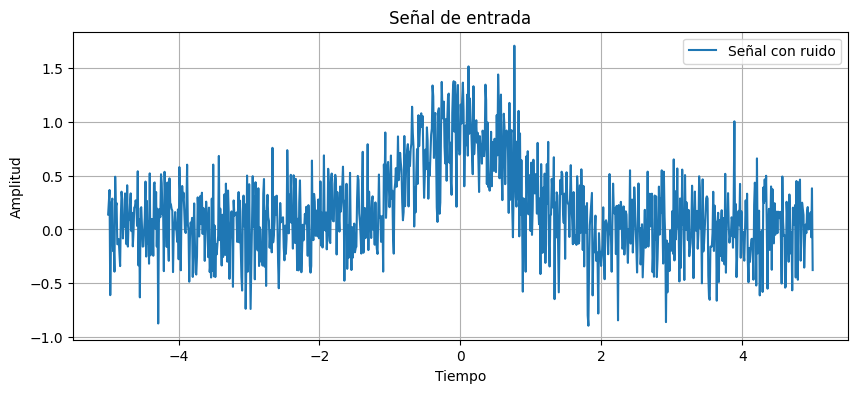

In [6]:
# Tiempo
x = np.linspace(-5, 5, 1000)

# Señal de prueba: pulso + ruido
señal = np.exp(-x**2) + 0.3 * np.random.randn(len(x))

plt.figure(figsize=(10, 4))
plt.plot(x, señal, label='Señal con ruido')
plt.title("Señal de entrada")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid(True)
plt.legend()
plt.show()


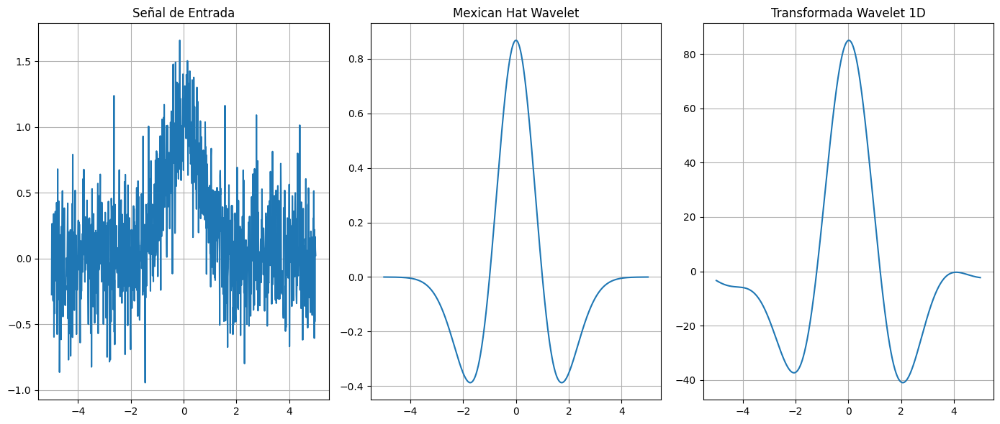

In [7]:
# Dominio de tiempo
x = np.linspace(-5, 5, 1000)

# Parámetro de la wavelet
sigma = 1.0

# Generamos la wavelet
wavelet = mexican_hat(x, sigma)

# Creamos una señal: gaussiana + ruido
señal = np.exp(-x**2) + 0.3 * np.random.randn(len(x))

# Aplicamos la convolución (Transformada Wavelet Continua)
transformada = np.convolve(señal, wavelet, mode='same')

# Visualización
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
plt.plot(x, señal)
plt.title("Señal de Entrada")
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(x, wavelet)
plt.title("Mexican Hat Wavelet")
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(x, transformada)
plt.title("Transformada Wavelet 1D")
plt.grid(True)

plt.tight_layout()
plt.show()


### 3.2 Escribe un algoritmo para calcular la transformada discreta
<p align="justify">
En cierta forma se trata solo de aplicar al sumatoria sobre una señal que tengas (obviamente debes definir una señal de estudio, con ruido o que tenga varías frecuencias involucradas).

Debes hacerlo solo para un nivel (level). Recuerda que la transformada trabaja por niveles y puede ser dispendioso. En este caso de debe considerar que $$a_0=2$$ y $$b_0=1$$, así como también debe asumir un valor específico para _m_.

En teoría, la transformada es como sigue:

$$ (T^{\text{wav}} f)(a,b) = \sqrt{|a|} \int dt \; f(t) \psi \left(\frac{t-b}{a}\right) $$

$a = a_0^m$ and $b = n b_0 a_0^m$

Aquí a y b son parámetros para la escala y posición de la wavelet. Esto se puede escribir de forma discreta de tal forma que puedas asignar una posición y escala a la onda asignando los valores que quieres, pero en este caso usarás $$a_0=2$$ y $$b_0=1$$. 

$$ (T^{\text{wav}} f)(a,b) = T^\text{wav}_{m,n}(f) = \int dt \; f(t) \psi_{m,n} (x) $$
con
$$ \psi_{m,n} = a_0^{\frac{-m}{2}} \psi\left(a_0^{-m}x - nb_0\right) $$

### Recuerda que la integral se convierte en una sumatoria.

###  3.2.1. Explica el siguiente fragmento de código en detalle

In [9]:
# we assume a0 = 2 and b0 = 1
# These are the scaling and translation factors
#using just o pair, means an specific wavelet
def psi_mn(psi, m, n):
    a = 2**m
    b = n*2**m
    wav = np.zeros(len(psi)*a + b)
    wav[b:b+len(psi)*a] = np.interp(np.arange(len(psi)*a)/a,np.arange(len(psi)),psi)
    return wav

psi = mexican_hat(np.arange(-5,5,0.1),0,1)
xlim = (0,350)
ns = [1, 30, 60]
ms = [0, 1]
plt.figure(figsize=(15,4))
plt.subplot(121)

for mi in range(len(ms)):
    m = ms[mi]
    plt.subplot(1,len(ms),mi+1)
    for n in ns:
        plt.plot(psi_mn(psi, m, n), label="n="+str(n))
    plt.title("m = "+str(m))
    plt.legend(loc="best")
    plt.xlim(xlim)
plt.show()

TypeError: mexican_hat() takes 2 positional arguments but 3 were given

### Visualización de la Wavelet Mexican Hat con Diferentes Escalas y Desplazamientos

Este fragmento de código permite observar cómo cambia la forma de una wavelet Mexican Hat al modificar sus parámetros de escala y traslación. Se define una función llamada `psi_mn`, que genera una versión escalada y desplazada de la wavelet original. 

La **escala** se calcula como:

$$
a = 2^m
$$

Esto sirve para estirar o comprimir la wavelet (dependiendo si \( m \) es mayor o menor), y la **traslación** se obtiene como:

$$
b = n \cdot 2^m
$$

Lo que mueve la wavelet horizontalmente sobre el eje del tiempo.

La función interpola la wavelet base para ajustarla a la nueva escala, y luego la inserta en un arreglo más grande a partir de la posición \( b \).

En este caso, se grafican distintas combinaciones de escala (`m = 0` y `m = 1`) y desplazamiento (`n = 1`, `30`, `60`). Los resultados se muestran en subgráficos, lo que facilita comparar entre sí las distintas versiones de la wavelet; se pueden detectar detalles de una señal en distintos niveles de resolución.





### 3.2.2 completa el siguiente código para realizar la transformada


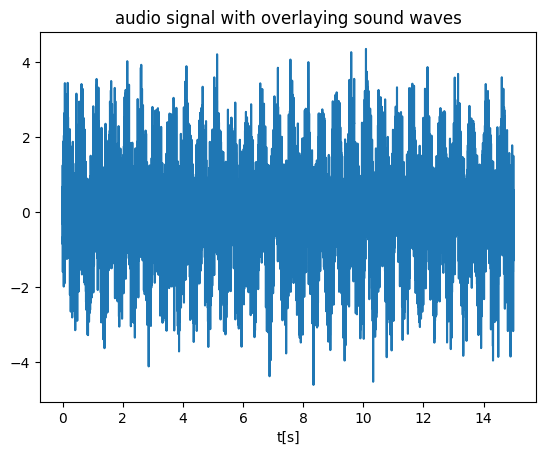

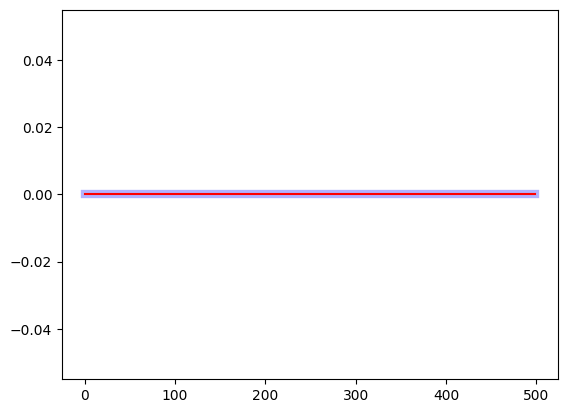

In [ ]:

"""Transformed considering the sum over the section under study"""
def twav_mn(f, psi, m, n):
    f_scaled = 0
    transform_scaled =  0
    return transform_scaled

"""Naive Transform adding over the whole length"""

def twav_mn_naive(f, psi, m, n):
    pmn = 0
    transform = 0
    return transform


m = 3 #single value for m
ns = np.arange(1000,1500)
res=1000 #resolution
freq=2 #frequency
"""Creating a wave to analyse"""
x = np.arange(0,15000,1) # Produces [0, 100) with steps of 2.
noise = np.random.normal(0,1, len(x)) #  μ = 0, σ = 2, size = length of x or y. Choose μ and σ wisely.
#adding noise
audio=np.sin(np.arange(15000)*2*np.pi*freq/res)+noise


transformed_sweept=[twav_mn(audio, psi, m, n) for n in ns]
naive_transformed_sweept=[twav_mn_naive(audio, psi, m, n) for n in ns]

plt.plot(np.arange(len(audio),dtype="float32")/res,audio)
plt.xlabel("t[s]")
plt.title("audio signal with overlaying sound waves")
plt.show()



plt.plot(transformed_sweept,color="blue", lw=6, alpha=0.3)
plt.plot(naive_transformed_sweept, "r-")
plt.show()

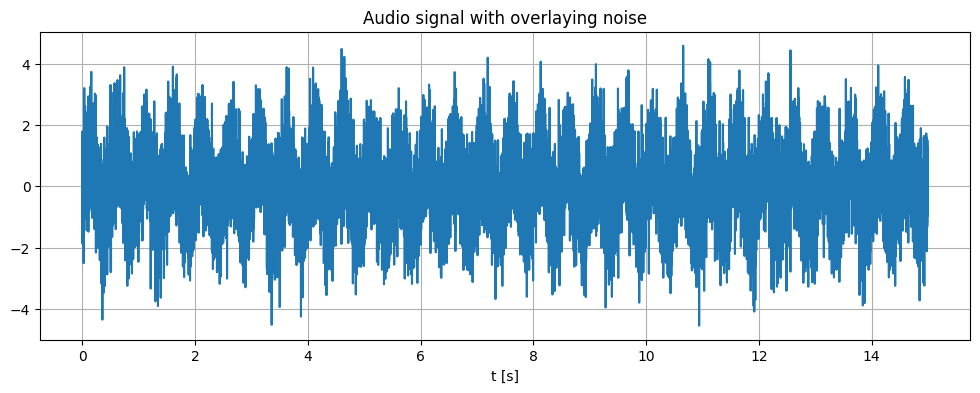

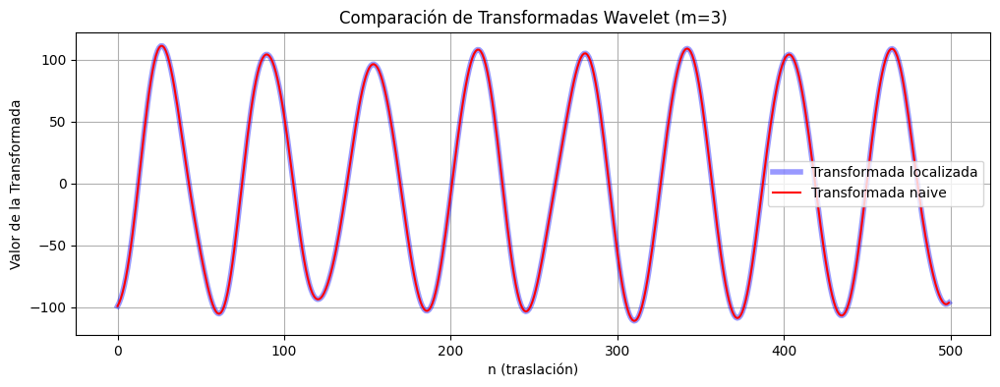

In [11]:
# --- Código Completo ---

import numpy as np
import matplotlib.pyplot as plt

def mexican_hat(x, sigma):
    coef = 2 / (np.sqrt(3 * sigma) * np.pi**0.25)
    factor = (1 - (x**2) / (sigma**2)) * np.exp(-x**2 / (2 * sigma**2))
    return coef * factor

# --- TRANSFORMADAS ---

"""Transformed considering the sum over the section under study"""
def twav_mn(f, psi, m, n):
    a = 2**m
    b = n * a
    length = len(psi) * a
    if b + length >= len(f):
        return 0
    # Interpola la wavelet escalada
    scaled_psi = np.interp(np.arange(length)/a, np.arange(len(psi)), psi)
    segment = f[b : b + length]
    transform_scaled = np.sum(segment * scaled_psi)
    return transform_scaled

"""Naive Transform adding over the whole length"""
def twav_mn_naive(f, psi, m, n):
    a = 2**m
    b = n * a
    wav = np.zeros(len(f))
    # Crea la wavelet escalada y desplazada
    scaled_psi = np.interp(np.arange(len(psi)*a)/a, np.arange(len(psi)), psi)
    if b + len(scaled_psi) >= len(f):
        return 0
    wav[b : b + len(scaled_psi)] = scaled_psi
    transform = np.sum(f * wav)
    return transform

# --- PARÁMETROS ---

m = 3 # escala fija
ns = np.arange(1000,1500) # desplazamientos
res = 1000
freq = 2

# --- SEÑAL DE AUDIO SINTÉTICA ---

x = np.arange(0,15000,1)
noise = np.random.normal(0,1,len(x))
audio = np.sin(x * 2 * np.pi * freq / res) + noise

# --- WAVELET BASE ---

psi = mexican_hat(np.linspace(-5, 5, 100), sigma=1)

# --- TRANSFORMADAS ---

transformed_sweept = [twav_mn(audio, psi, m, n) for n in ns]
naive_transformed_sweept = [twav_mn_naive(audio, psi, m, n) for n in ns]

# --- GRAFICAR SEÑAL ---

plt.figure(figsize=(12, 4))
plt.plot(np.arange(len(audio), dtype="float32")/res, audio)
plt.xlabel("t [s]")
plt.title("Audio signal with overlaying noise")
plt.grid(True)
plt.show()

# --- GRAFICAR TRANSFORMADAS ---

plt.figure(figsize=(12, 4))
plt.plot(transformed_sweept, color="blue", lw=4, alpha=0.4, label="Transformada localizada")
plt.plot(naive_transformed_sweept, "r-", label="Transformada naive")
plt.title("Comparación de Transformadas Wavelet (m=3)")
plt.xlabel("n (traslación)")
plt.ylabel("Valor de la Transformada")
plt.legend()
plt.grid(True)
plt.show()


### 3.3 Wavelet usando librería
<p align="justify">
Usa la librería PyWavelets (pywt) con los datos provenientes del dataset  = "http://paos.colorado.edu/research/wavelets/wave_idl/sst_nino3.dat". Estos datos son históricos sobre el fenómeno del Niño. 

0. Debes descargar los datos desde python, usando numpy o pandas, debes aplicar la transformada continua pywt.cwt.

1. Obtendrás los coeficientes de la transformación.
2. Debes poner todos los resultados en términos de potencia. 
3. Debes graficar el resultado tanto en el periodo como en la frecuencia usando un plot tipo contour.


Valores de la señal:
Media: -1.9841724e-05
Desviación estándar: 0.73359907


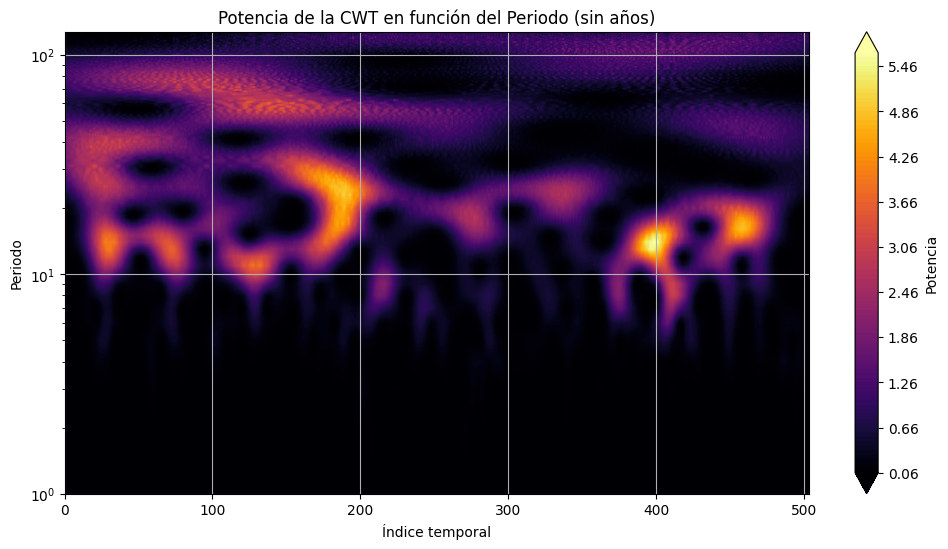

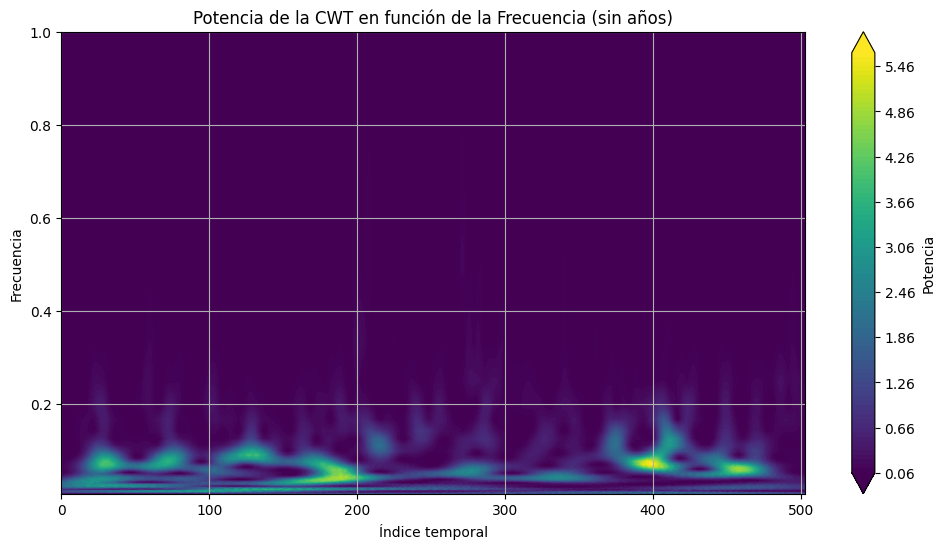

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
import urllib.request
from io import StringIO

# === DESCARGA Y CARGA DEL ARCHIVO (una sola columna) ===
url = "http://paos.colorado.edu/research/wavelets/wave_idl/sst_nino3.dat"
response = urllib.request.urlopen(url)
data_txt = response.read().decode('utf-8')

# Cargar solo la columna con datos
data_io = StringIO(data_txt)
df = pd.read_csv(data_io, header=None, names=["Anomaly"])

# === USAR SOLO LA SEÑAL DE ANOMALÍAS ===
signal = df["Anomaly"].values.astype(np.float32)

# Crear eje temporal artificial (por ejemplo, mensual desde el inicio)
time = np.arange(len(signal))  # Suponemos un muestreo regular

# Limpiar la señal
signal = np.nan_to_num(signal)
mean = np.mean(signal)
std = np.std(signal)

print("\nValores de la señal:")
print("Media:", mean)
print("Desviación estándar:", std)

if std != 0:
    signal = (signal - mean) / std
else:
    print("La señal es constante, no se normaliza.")

# === APLICAR TRANSFORMADA WAVELET CONTINUA (CWT) ===
scales = np.arange(1, 128)
coef, freqs = pywt.cwt(signal, scales, 'cmor1.5-1.0', sampling_period=1)

# Potencia y periodo
power = np.abs(coef) ** 2
period = 1 / freqs

# Ajuste de tiempo si hay diferencias de dimensión
if power.shape[1] != len(time):
    time = np.linspace(time[0], time[-1], power.shape[1])

# === GRÁFICO: Potencia vs Periodo ===
plt.figure(figsize=(12, 6))
plt.contourf(time, period, power, levels=100, cmap="inferno", extend='both')
plt.yscale("log")
plt.title("Potencia de la CWT en función del Periodo (sin años)")
plt.xlabel("Índice temporal")
plt.ylabel("Periodo")
plt.colorbar(label="Potencia")
plt.grid(True)
plt.show()

# === GRÁFICO: Potencia vs Frecuencia ===
plt.figure(figsize=(12, 6))
plt.contourf(time, freqs, power, levels=100, cmap="viridis", extend='both')
plt.title("Potencia de la CWT en función de la Frecuencia (sin años)")
plt.xlabel("Índice temporal")
plt.ylabel("Frecuencia")
plt.colorbar(label="Potencia")
plt.grid(True)
plt.show()


### 3.4 Interpreta los resultados del punto anterior.
<p align="justify">
Debes explicar que significa el gráfico obtenido  en términos del periodo o frecuencia del evento que estamos analizando.

R//

En los gráficos obtenidos con la transformada wavelet, lo que vemos es cómo cambian las frecuencias presentes en la señal a lo largo del tiempo. A diferencia de una transformada de Fourier que te dice "qué frecuencias hay" en toda la señal, la wavelet te dice también cuándo están presentes esas frecuencias, lo cual es mucho más útil si estamos analizando fenómenos que no son constantes en el tiempo, como El Niño.

En el gráfico de potencia vs. periodo, el eje Y representa el periodo (inverso de la frecuencia) y está en escala logarítmica. Las zonas con colores más intensos indican que en ese momento del tiempo, había componentes importantes de la señal con ese periodo. En este caso, se ve claramente que hay bastante actividad en la zona de periodos entre 2 y 7 unidades, lo cual tiene sentido porque el fenómeno ENSO (El Niño - Oscilación del Sur) ocurre más o menos con esa frecuencia.

Entonces, básicamente este gráfico nos dice que hay ciclos importantes que se repiten aproximadamente cada 2 a 7 "tiempos" (que podrían ser años o meses dependiendo del muestreo real), y que su intensidad cambia con el tiempo. Es decir, no siempre está presente con la misma fuerza, lo cual también se relaciona con cómo se comporta El Niño en la realidad: hay años donde es más notorio y otros donde casi ni se siente.



## 4. Obtén el espectrograma de tu señal de audio
Sobre la señal de audio en el punto 1 de la actividad, debe presentar el espectragrama


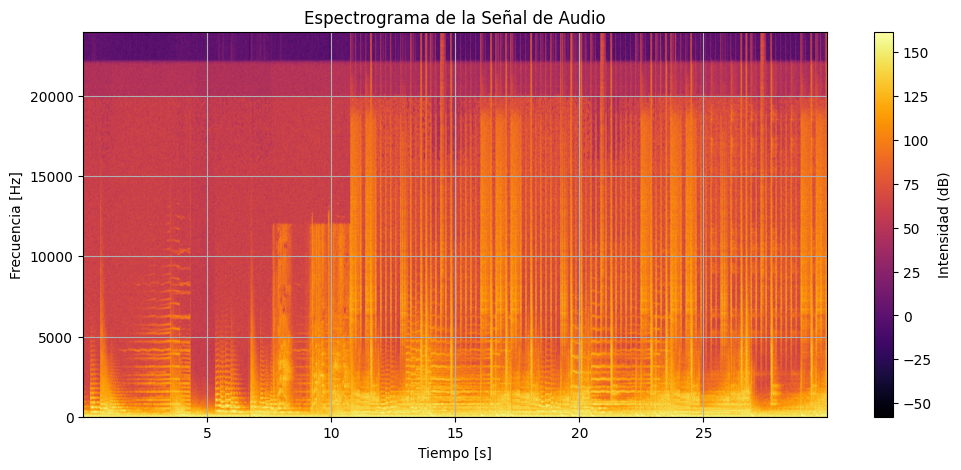

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from IPython.display import Audio

# --- 1. Leer archivo de audio ---
fs, data = wavfile.read('audio.wav')

# Convertir a mono si es estéreo
if len(data.shape) == 2:
    data = data.mean(axis=1)

# Limitar a 30 segundos
max_duration = 30
max_samples = fs * max_duration
data = data[:max_samples]

# Reproducir audio
Audio(data=data, rate=fs)

# --- 2. Calcular y mostrar el espectrograma ---
plt.figure(figsize=(12, 5))
plt.specgram(data, Fs=fs, NFFT=1024, noverlap=512, cmap='inferno')
plt.title('Espectrograma de la Señal de Audio')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.colorbar(label='Intensidad (dB)')
plt.grid(True)
plt.show()


## 5. Slicing
Desarrolla un framento de código que te permita tomar una señal de audio y framentarla en N segmentos o slices. Debe asignar la longitud temporal de cada slice y el programa debe indicar el número de slices que quedan. Considera que al final puede quedar un slice de longitud diferente a todos los demas.

En el slicing debes también incluir un gap o overlap a lado y lado de cada uno de los fragmentos. Este overlap debe ser ajustable del número de muestras que constituyen dicho overlap.

<center><img src="../../assets/slices.png"/></center>


Total de fragmentos generados: 16
El último slice tiene una longitud diferente (por llegar al final del archivo).


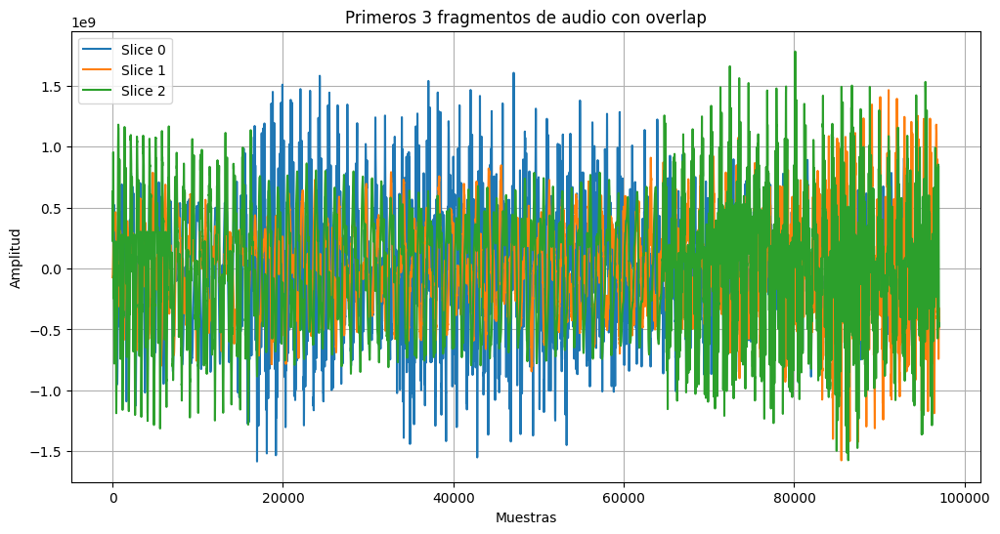

In [26]:
import numpy as np
from scipy.io import wavfile

# --- Leer audio ---
fs, data = wavfile.read('audio.wav')

# Convertir a mono si es estéreo
if len(data.shape) == 2:
    data = data.mean(axis=1)

# --- Parámetros de slicing ---
dur_slice_sec = 2             # Duración deseada por slice (en segundos)
overlap_samples = 500         # Overlap a cada lado (en muestras)

# --- Cálculos base ---
slice_len = int(fs * dur_slice_sec)              # Longitud de cada slice sin overlap
step_size = slice_len                            # Avance sin considerar el solape
slice_total_len = slice_len + 2 * overlap_samples  # Slice completo incluyendo el overlap

# --- Fragmentar señal ---
slices = []
start = 0

while start < len(data):
    # Extremos del fragmento incluyendo overlap
    left = max(0, start - overlap_samples)
    right = min(len(data), start + slice_len + overlap_samples)

    fragment = data[left:right]
    slices.append(fragment)

    start += step_size  # avanzar por el tamaño original del slice

# --- Resultado ---
print(f"Total de fragmentos generados: {len(slices)}")
if len(slices[-1]) != slice_total_len:
    print("El último slice tiene una longitud diferente (por llegar al final del archivo).")

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for i in range(min(3, len(slices))):
    plt.plot(slices[i], label=f"Slice {i}")
plt.title("Primeros 3 fragmentos de audio con overlap")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.legend()
plt.grid(True)
plt.show()


## 5.1 Slicing usando Pytorch de la señal obtenida en el primer punto.
Debes crear un array con los slices creados a partir de tensores en pytorch.
Grafica un par de tus slices y reproduce el audio.


Número de slices generados: 16
Forma de tensor final: torch.Size([16, 97000])


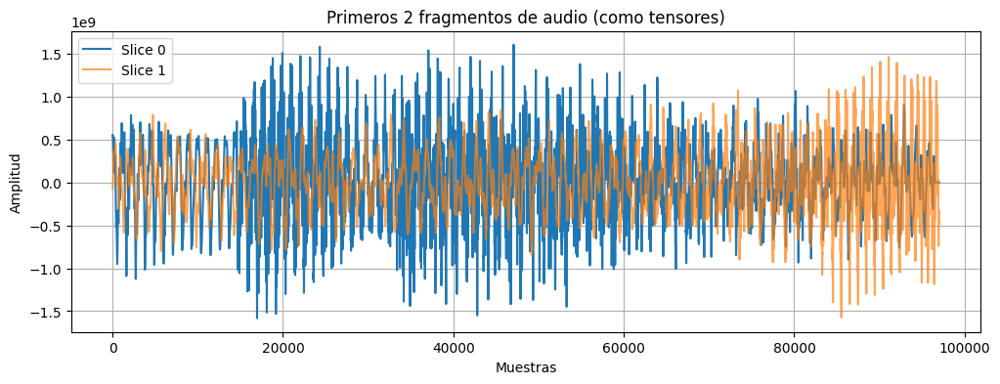

In [24]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from IPython.display import Audio

# --- Leer el archivo de audio ---
fs, data = wavfile.read('audio.wav')

# Convertir a mono si es estéreo
if len(data.shape) == 2:
    data = data.mean(axis=1)

# Normalizar si es entero
if data.dtype.kind in ['i', 'u']:
    data = data / np.iinfo(data.dtype).max

# Convertir a tensor de PyTorch
signal = torch.tensor(data, dtype=torch.float32)

# --- Parámetros del slicing ---
slice_duration_sec = 2          # duración de cada slice (en segundos)
overlap_samples = 500           # overlap (en muestras)
slice_samples = int(fs * slice_duration_sec)
step = slice_samples            # avanzar sin considerar overlap
total_slice_len = slice_samples + 2 * overlap_samples

# --- Realizar slicing ---
slices = []
start = 0
while start < len(signal):
    left = max(0, start - overlap_samples)
    right = min(len(signal), start + slice_samples + overlap_samples)
    fragment = signal[left:right]
    slices.append(fragment)
    start += step

# Convertir a tensor 2D (padded si es necesario)
max_len = max([len(s) for s in slices])
slices_padded = [torch.nn.functional.pad(s, (0, max_len - len(s))) for s in slices]
slices_tensor = torch.stack(slices_padded)

print(f"Número de slices generados: {slices_tensor.shape[0]}")
print(f"Forma de tensor final: {slices_tensor.shape}")

#----
plt.figure(figsize=(12, 4))
plt.plot(slices_tensor[0].numpy(), label="Slice 0")
plt.plot(slices_tensor[1].numpy(), label="Slice 1", alpha=0.7)
plt.title("Primeros 2 fragmentos de audio (como tensores)")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.legend()
plt.grid(True)
plt.show()

#----
# Reproducir el primer fragmento (slice)
Audio(slices_tensor[0].numpy(), rate=fs)




## 6. Filtro Butterworth para una señal de audio.
Diseña y aplica un filtro butterworth a tu señal de audio, para diferentes ordenes y niveles de rizado.
Muestra gráficos con las diferentes respuestas del filtro butterworth y explica el resultado. 

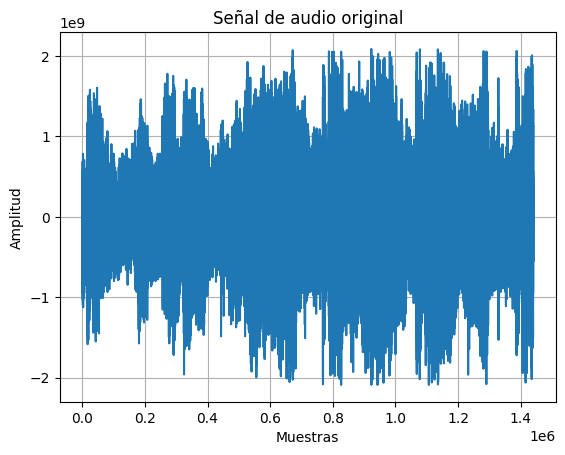

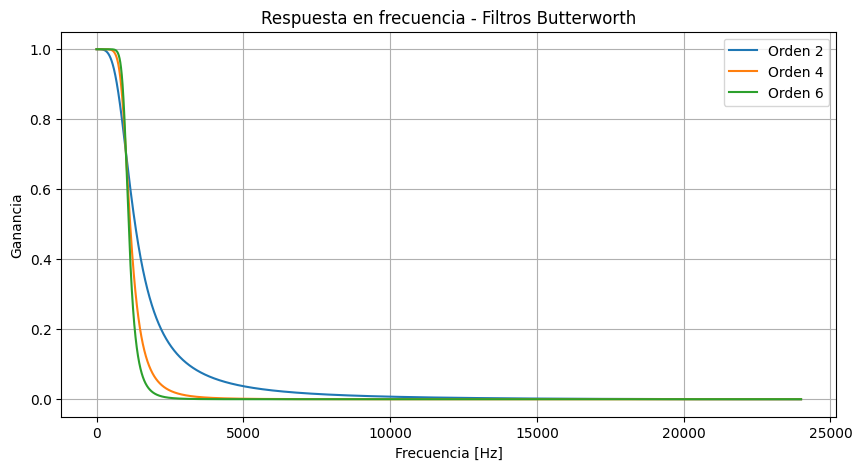

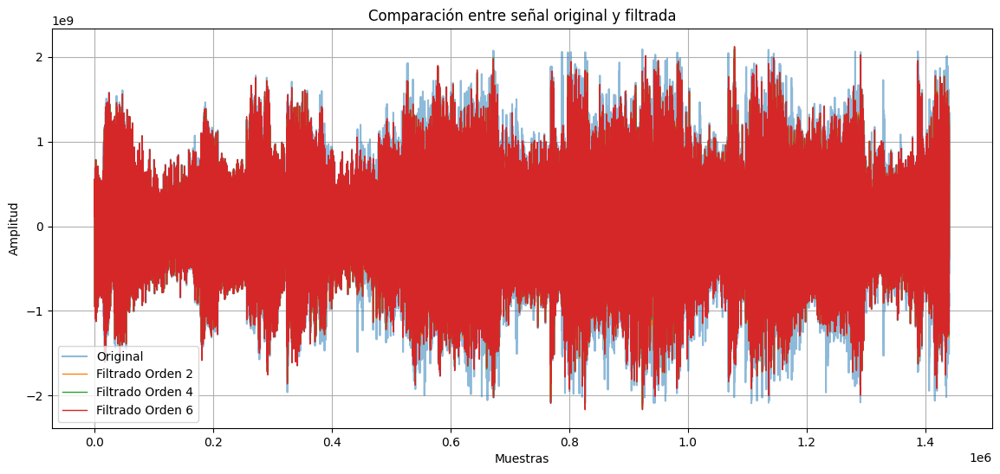

Audio filtrado con Butterworth orden 2:


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import butter, filtfilt, freqz
from IPython.display import Audio

fs, data = wavfile.read("audio.wav")

# Convertir a mono si es estéreo
if len(data.shape) == 2:
    data = data.mean(axis=1)

# Normalizar si es entero
if data.dtype.kind in ['i', 'u']:
    data = data / np.iinfo(data.dtype).max

# Mostrar y reproducir
plt.plot(data)
plt.title("Señal de audio original")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.grid(True)
plt.show()

Audio(data, rate=fs)

def plot_butter_response(fs, cutoff_hz, orders):
    plt.figure(figsize=(10, 5))
    for order in orders:
        b, a = butter(order, cutoff_hz / (0.5 * fs), btype='low')
        w, h = freqz(b, a, worN=8000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label=f"Orden {order}")
    plt.title("Respuesta en frecuencia - Filtros Butterworth")
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Ganancia")
    plt.grid(True)
    plt.legend()
    plt.show()

# Probar con frecuencias de corte y distintos órdenes
cutoff = 1000  # Hz
plot_butter_response(fs, cutoff_hz=cutoff, orders=[2, 4, 6])

def butterworth_filter(data, fs, cutoff, order):
    b, a = butter(order, cutoff / (0.5 * fs), btype='low')
    return filtfilt(b, a, data)

# Aplicar filtros de diferentes órdenes
filtered2 = butterworth_filter(data, fs, cutoff=1000, order=2)
filtered4 = butterworth_filter(data, fs, cutoff=1000, order=4)
filtered6 = butterworth_filter(data, fs, cutoff=1000, order=6)

plt.figure(figsize=(14, 6))
plt.plot(data, label='Original', alpha=0.5)
plt.plot(filtered2, label='Filtrado Orden 2', linewidth=1)
plt.plot(filtered4, label='Filtrado Orden 4', linewidth=1)
plt.plot(filtered6, label='Filtrado Orden 6', linewidth=1)
plt.title("Comparación entre señal original y filtrada")
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.legend()
plt.grid(True)
plt.show()

print("Audio filtrado con Butterworth orden 2:")
Audio(filtered2, rate=fs)


R// Este tipo de filtro se utiliza comúnmente cuando se busca eliminar frecuencias altas sin deformar mucho la señal original, ya que tiene una caída suave y no presenta rizado en la banda pasante. Se probaron varios órdenes para ver cómo cambia la pendiente del corte: mientras más alto es el orden, más abrupto es el descenso en la ganancia después de la frecuencia de corte. A través de los gráficos se puede ver claramente cómo se suavizan o eliminan ciertas componentes de la señal, especialmente las de mayor frecuencia, lo que ayuda a limpiar el audio sin afectarlo bruscamente.




## 7. Referencias
<p align="justify">

https://notebook.community/CSchoel/learn-wavelets/wavelet-introduction

https://www.kaggle.com/code/asauve/a-gentle-introduction-to-wavelet-for-data-analysis

https://pywavelets.readthedocs.io/en/latest/ref/cwt.html

[Análisis espectral para audio] https://ccrma.stanford.edu/~jos/mdft/mdft-python.html

[Cancelación de ruido en datos] https://towardsdatascience.com/noise-cancellation-with-python-and-fourier-transform-97303314aa71

[Convolución en Scipy]https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve.html

[Wavelet transform applications]https://scicoding.com/introduction-to-wavelet-transform-using-python/

    
[Análisis espectral para audio] https://ccrma.stanford.edu/~jos/mdft/mdft-python.html

[Análisis espectral] https://currents.soest.hawaii.edu/ocn_data_analysis/_static/Spectrum.html
